**Lab 6: IIR Filtering**


The objective for this lab is to help you understand the relationship between the location
of poles and zeros in the z-domain, the impulse response h[n] in the n-domain, and the frequency
response $H(e^{j\omega})$. We use the system function,
represented as a ratio of polynomials in $z^{-1}$, which can be expressed in either factored or expanded form as:

$$
H(z) = G\frac{\prod_{k=1}^M (1-z_kz^{-1}) }{\prod_{k=1}^N (1-p_kz^{-1})} = \frac{ \sum_{k=0}^M b_kz^{-k}}{ 1- \sum_{k=1}^N a_kz^{-k} }
$$

In [2]:
import numpy as np
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from util import load_audio, plot_signals, plot_spectrogram, plot_frequency_response

**1. IIR filters to extract the envelope**

In the previous labs, you extracted the envelope from your reference signal by applying the following system:

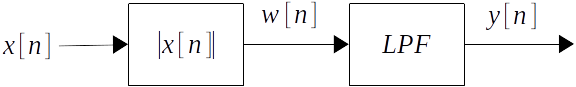

where $w[n] = |x[n]|$ and $y[n]$ was the output of a low-pass FIR filter (averaging filter). In this exercise, you will re-implement this low-pass filter as an IIR.

1.1 First, copy the functions envelope and synthesize from previous work and obtain the same synthesis. 



In [43]:
def synthesize(f0, phi, Ak, t):
  y = 0
  for k in range(1, len(Ak) + 1):
    y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
  return y

def envelope(x, N):
    x_rectified = np.abs(x)
    h = np.ones(N) / N
    y = np.convolve(x_rectified, h, mode='same')
    
    return y

soundfile, fs = load_audio('audio/soundfile.wav')

N = 100
y_envelope = envelope(soundfile, N)

f0 = 387.5977
phi = 0
weights = [1, 0.1943, 0.1275, 0.1234, 0.0026, 0.0104, 0.0044]
t = np.linspace(0, len(soundfile) / fs, len(soundfile))

synth_signal = synthesize(f0, phi, weights, t)
synth_signal_lab4 = synth_signal * y_envelope

print("Original Signal:")
ipd.Audio(soundfile, rate=fs)

Original Signal:


1.2 Let's take a look at the following system:

$$
H(z) = G\frac{1+z^{-1}}{1-rz^{-1}} \quad   0<r<1 \quad, G = \frac{1-r}{2}
$$

Note that the coefficients of the filter are the following:

$$
b_0 = 1, \quad b_1 = 1, \quad a_0 = 1, \quad a_1 = -r, \quad
$$

i. Find the zeros and poles of the system analytically.

Multipliquem el numerador i el denominador per a z, de tal manera que ens queda:
$$ H(z) = G\frac{z+1}{z-r} $$
Sabem que els zeros son els valors de z per a les quals el numerador es igual a 0, per tant:
$$ z+1=0 \implies z=-1 $$
Per tant, el zero del sistema és $z=-1$.

Per a trobar els pols, fem el mateix amb el denominador:
$$ z-r=0 \implies z=r $$
Per tant, el pol de la funció és $z=r$.

ii. Use the function `np.roots` to find the zeros and poles using Python. Compare the results with part i.

In [5]:
r = 0.5 #número inventat per a que no doni error

b = [1, 1]
a = [1, -r]

zeros = np.roots(b)
poles = np.roots(a)

print("Zeros:", zeros)
print("Poles:", poles)

Zeros: [-1.]
Poles: [0.5]


iii. Use the function  `plot_zeros_poles(z, p)` to plot the zeros and poles found in ii.

In [7]:
from util import plot_zeros_poles

plot_zeros_poles(zeros, poles)

1.3 Let's see the frequency response of this filter:



In [ ]:
r=0.9
G = (1 - r) / 2

w = np.linspace(-np.pi, np.pi, 2000)

z = np.exp(1j * w)
H = G * (1 + z**(-1)) / (1 - r * z**(-1))

plot_frequency_response(w, H)

1.4. Change the parameter $r$ in the range $(0, 1)$. What happens when $r$ is increased?

Al augmentar el valor de r, el sistema es torna més sensible a las perturbacions. El pol s'apropa al cercre unitari, la magnitud es fa més pronunciada a les freqüències més baixes, i per tant es filtre es comporta més com un filtre de pasa baix.

1.5 What type of filter is (low-pass, band-pass, or high-pass filter)?


És un filtre de tipus low-pass, ja que el pol està prop de 1, el que reforça les freqüències baixes. El zero està a -1 el que equival a la frequüència pi, tenuant les freqüències altes. La magnitud és màxima en w=0 i mínima en w=pi.

1.6 Now we can use this IIR filter to extract the envelope. Let's define a new function `envelope_iir(x)` that applies the filter to the absolute value of the signal. Note that we are using signal.lfilter function to apply the filter.


In [18]:
def envelope_iir(x, r=0.995):
    a = [1, -r]
    b = [1, 1]
    G = (1 - r) / 2

    x_abs = np.abs(x)

    y = G * signal.lfilter(b, a, x_abs)

    return y

Extract the envelope of your reference signal using both the FIR and IIR filters and compare the results plot them along with the signal. Change the value of $r$ until you are comfortable with the result.

In [23]:
envelopeFir = envelope(soundfile, N)
envelopeIir = envelope_iir(soundfile, r=0.995)

plot_signals([soundfile, envelopeFir, envelopeIir], fs, name=['Reference Signal', 'Envelope FIR', 'Envelope IIR'], mode='lines')

1.7 What are the main differences between the two filters? For instance, compare the number of coefficients.

Amb N = 100, el filtre FIR utilitza molts més coeficients i és un filtre no recursiu que fa la mitjana de 100 mostres, la qual cosa el fa molt estable però computacionalment més costós. En canvi, el filtre IIR amb r = 0.955 només necessita dos coeficients al numerador i dos al denominador, per la qual cosa és molt més eficient. A més, com que és recursiu, obté un suavitzat similar utilitzant molts menys paràmetres.

1.8 Apply the new envelope (extracted from the IIR filter) to the synthesis generated with the `synthesize` function and listen to the result.

In [ ]:
synth_signal_iir = synth_signal * envelopeIir

print("Synthesized signal with IIR envelope:")
ipd.Audio(synth_signal_iir, rate=fs)

---

**2. Band-pass filters**

Now let's work with the following system: 

$$
H(z) = \frac{(1-z^{-1})(1+z^{-1})}{(1-re^{j\omega_n}z^{-1})(1-re^{-j\omega_n}z^{-1})}, \quad 0<r<1
$$

Note that the poles are $p_1 = re^{j\omega_n}$ and $p_2 = re^{-j\omega_n}$; and the zeros are $z_1=1$ and $z_2=-1$. 

2.1 Use the function `plot_zeros_poles` to plot the zeros and poles of the system.

Note: use $w_n = \pi/4$ and $r=0.99$.

In [26]:
wn = np.pi/4
r = 0.99

a = [1, -2 * r * np.cos(wn), r**2]
b = [1, 0, -1]

zeros = np.roots(b)
poles = np.roots(a)

plot_zeros_poles(zeros, poles)

2.2 Show analytically that $a_k = [1, -2rcos(\omega_n), r^2]$ and $b_k=[1, 0, -1]$.

Multipliquem els factors del numerador i del denominador i arrodonim en potències de $z^{-1}$.
Numerador: 
$(1-z^{-1})(1+z^{-1})=1-z^{-2}.$

I per tant:
$b_k = [1, 0, -1].$

Denominador:
$(1−re^{jω_n}z^{-1})(1−re^{−jω_n}z^{-1})=1−r(e^{jω_n}+e^{−jω_n})z^{-1}+r^2z^{-2}.$

Utilitzant $e^{jω}+e^{−jω}=2cosω$ queda
$a(z)=1−2rcos(𝜔_n)z^{-1}+r^2z^{-2}.$

I per tant:
$a_k = [1, -2rcos(𝜔_n), r^2].$

Així obtenim:
$a_k = [1, -2rcos(𝜔_n), r^2].$ i $b_k = [1, 0, -1].$

2.3 Plot the frequency response of the filter. Confirm this is a band-pass filter. What's the central frequency of the passband?

In [27]:
w = np.linspace(-np.pi, np.pi, 2000)
z = np.exp(1j * w)
H = (1 - z**(-2)) / (1 - 2*r*np.cos(wn)*z**(-1) + r**2 * z**(-2))

plot_frequency_response(w, H)

Podem observar que efectivament és un filtre band-pass, ja que a $\frac{\pi}{4}$ i $-\frac{\pi}{4}$ hi ha uns pics, el que vol dir que només deixa passar les freqüències que estàn a prop de $\frac{\pi}{4}$ i $-\frac{\pi}{4}$.

La freqüència central del passabanda és $𝜔_c = 𝜔_n = \frac{\pi}{4}$.

En Hertz és $f_c= \frac{𝜔_c}{2\pi} f_s = \frac{1}{8}f_s$.

2.4 Define a function `bpf(x, f, r, fs)` that applies the above band-pass filter. 

Note 1: remember that a frequency can be converted to the normalized radian frequncy by: $\omega_n = 2\pi f_n/f_s$.

Note 2: use `signal.lfilter` function to implement the filter.

In [28]:
def bpf(x, fn, fs, r=0.995):
  """Applies a band-pass filter with central frequency fn

  Parameters
  ----------
  x : np.array
      The input signal in the form of a numpy array
  fn: int or float
      Central frequency of the band pass in Hz 
  fs : int or float
      Frequency rate in Hz
  r: float
      Magnitude of the poles

  Returns
  -------
  y : np.array
      The output of the filter

  """
  wn = 2 * np.pi * fn / fs
  b = [1.0, 0.0, -1.0]
  a = [1.0, -2.0 * r * np.cos(wn), r**2]

  y = signal.lfilter(b, a, x)
  return y

2.5 Regardless of the phase, until now we were synthesizing the instrument signal by summing $K$ harmonics of the signal with different weights ($A_k$) and multiplying the sum by the envelope of the reference signal ($e(t)$):

$$y(t) = e(t) \cdot \sum_{k=1}^K A_k\cos\left(2\pi kf_0 t \right), $$

where $f_0$ is the fundamental frequency of the note. Now we want to improve this synthesis by finding a time-dependent amplitude ($A_k(t)$) for each harmonic:

$$y(t) = \sum_{k=1}^K A_k(t) \cos\left(2\pi kf_0 t \right), $$

where $A_k(t)$ is the amplitude of the harmonic $k$. To extract the amplitudes $A_k(t)$ we'll apply a band-pass filter with central frequency $kf_0$ and calculate the envelope of the output by using the `envelope_iir`.


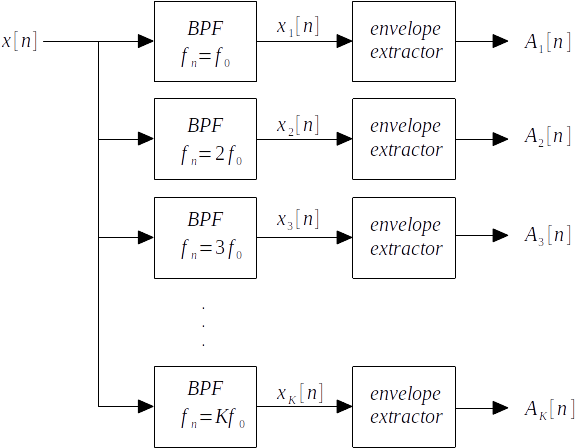

For instance, the following code should extract the envelope of the fundamental frequency component. Change the value of $f_0$ to coincide with your fundamental frequency and check the result. 

In [ ]:
x_fundamental = bpf(soundfile, fn=f0, fs=fs, r=0.995)

A1_t = envelope_iir(x_fundamental, r=0.995)

plot_signals([x_fundamental, A1_t], fs, name=["Fundamental Filtered", "Envelope (A1(t))"])
print("Fundamental Filtered:")
ipd.Audio(x_fundamental, rate=fs)

2.6 Complete the `synthetize_with_bpf` function to implement a synthesis applying different envelopes for each harmonic.


In [39]:
def synthetize_with_bpf(x, f0, phi, K, fs):
  """Synthetizes an harmonic signal using different envelopes for each harmonic
  The envelops are extracted from the reference signal x.

  Parameters
  ----------
  x : np.array
      The reference signal in the form of a numpy array
  f0: int or float
      Fundamental frequency of the synthesis
  phi : float
      Phase
  K: int
      Number of harmonics
  fs : int or float
      Frequency rate in Hz

  Returns
  -------
  y : np.array
      The output of the filter

  """
  x = np.asarray(x)
  n = len(x)
  t = np.linspace(0, n/fs, n)
  y = np.zeros(n)

  for k in range(1, K+1):
    fn = k * f0
    x_k = bpf(x, fn, fs, r=0.995)
    A_k_t = envelope_iir(x_k, r=0.995)
    harmonic = A_k_t * np.cos(2 * np.pi * k * f0 * t + k * phi - (k-1) * np.pi/2)
    y += harmonic

  return y

2.6 Call the function `synthetize_with_bpf` to get the synthesized signal and **listen to it**.

Note that now you can increase the number of harmonics $K$ as you want because we are not manually measuring the weights of each harmonic.

In [ ]:
K = 20
plot_seconds = 2.0

y_synth = synthetize_with_bpf(soundfile, f0, phi, K, fs)
print("Synthesized signal")
ipd.Audio(y_synth, rate=fs)

2.7 Compare the **spectrograms** of the synthesized signal and reference signal.

(0.0, 4000.0)

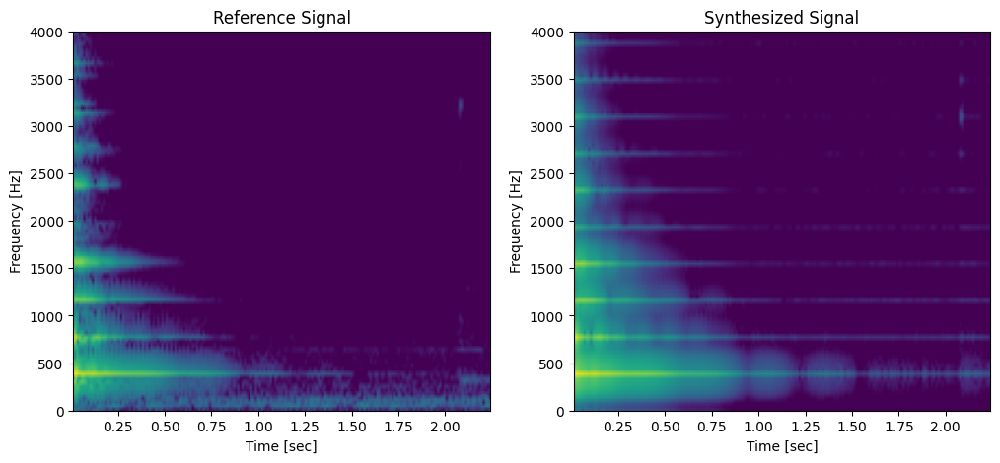

In [ ]:
ff, tt, ref = signal.spectrogram(soundfile, fs, nperseg=1024, noverlap=512)
ff, tt, synth = signal.spectrogram(y_synth, fs, nperseg=1024, noverlap=512)

plt.figure(figsize=(12, 5))

plt.subplot(1,2,1)
plot_spectrogram(ff, tt, ref)
plt.title('Reference Signal')
plt.ylim([0, 4000])

plt.subplot(1,2,2)
plot_spectrogram(ff, tt, synth)
plt.title('Synthesized Signal')
plt.ylim([0, 4000])